classification of diabetes data



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_predict, StratifiedKFold, cross_val_score
from sklearn.metrics import recall_score,precision_score, classification_report,confusion_matrix, accuracy_score, roc_curve, auc, ConfusionMatrixDisplay
from sklearn import tree


In [ ]:
#Import data
df = pd.read_csv("diabetes_prediction_dataset.csv")

In [ ]:
df.shape

(100000, 9)

In [ ]:
df.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


In [ ]:
df.info()
#No nulls

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


In [ ]:
df.describe()
#detect outlier

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
count,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,41.885856,0.07485,0.039420,27.320767,5.527507,138.058060,0.085000
std,22.516840,0.26315,0.194593,6.636783,1.070672,40.708136,0.278883
min,0.080000,0.00000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,24.000000,0.00000,0.000000,23.630000,4.800000,100.000000,0.000000
50%,43.000000,0.00000,0.000000,27.320000,5.800000,140.000000,0.000000
75%,60.000000,0.00000,0.000000,29.580000,6.200000,159.000000,0.000000
max,80.000000,1.00000,1.000000,95.690000,9.000000,300.000000,1.000000


# EDA

## Univariate visualization
### Categorical variables
gender, hypertension, heart_disease, smoking_history, diabetes

In [ ]:
def bar_plot(variable):
    # get feature
    var = df[variable]
    # count number of categorical variable
    varValue = var.value_counts()

    colors = sns.color_palette("Set2", n_colors=len(varValue))
    # visualize
    plt.figure(figsize = (5.5,2))
    plt.bar(varValue.index, varValue, color=colors)
    plt.xticks(varValue.index, varValue.index.values)
    plt.ylabel("count")
    plt.title(variable)
    plt.show()
    print(df[variable].value_counts())

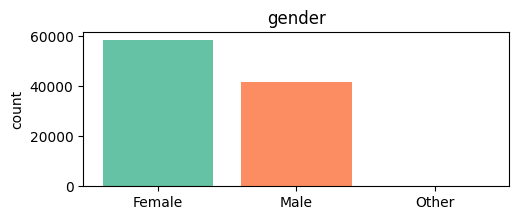

gender
Female    58552
Male      41430
Other        18
Name: count, dtype: int64


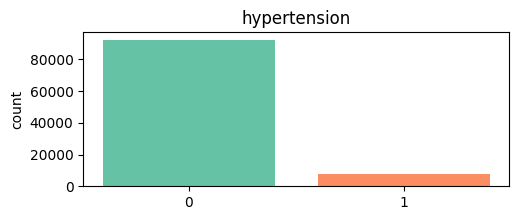

hypertension
0    92515
1     7485
Name: count, dtype: int64


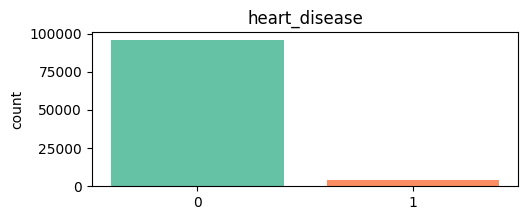

heart_disease
0    96058
1     3942
Name: count, dtype: int64


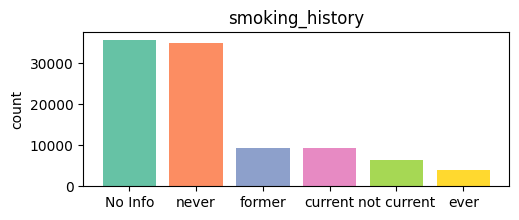

smoking_history
No Info        35816
never          35095
former          9352
current         9286
not current     6447
ever            4004
Name: count, dtype: int64


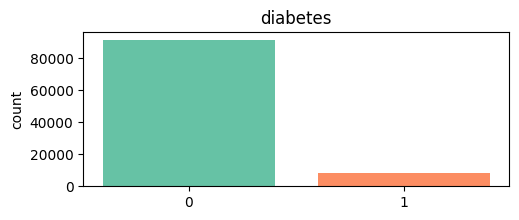

diabetes
0    91500
1     8500
Name: count, dtype: int64


In [ ]:
category1 = ["viewcount","likes","dislikes","smoking_history","diabetes"]
for c in category1:
    bar_plot(c)

### Numerical variables
age, bmi, HbA1c_level, blood_glucose_level

In [ ]:
def plot_hist(variable):
    plt.figure(figsize = (9,3))
    plt.hist(df[variable], bins = 40)
    plt.xlabel(variable)
    plt.ylabel("frequency")
    plt.title(variable)
    plt.show()

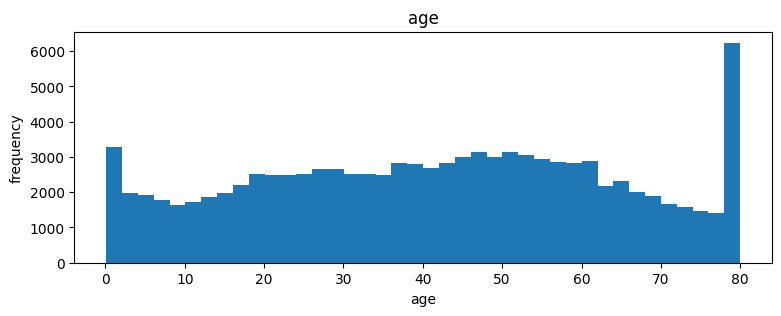

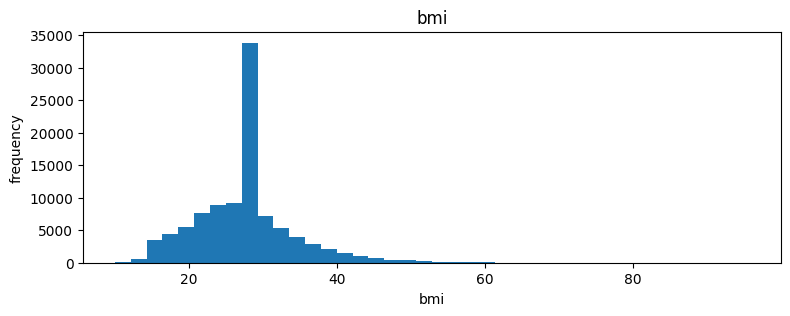

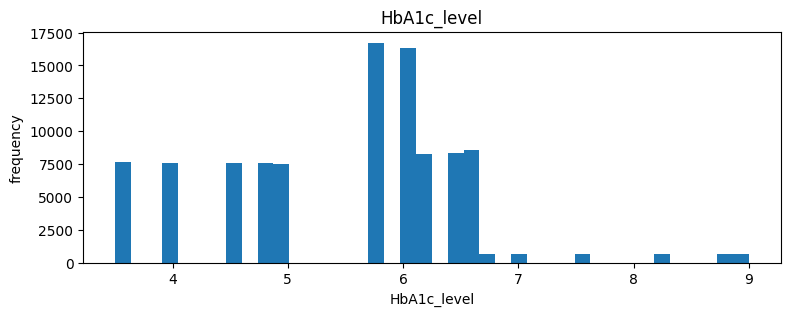

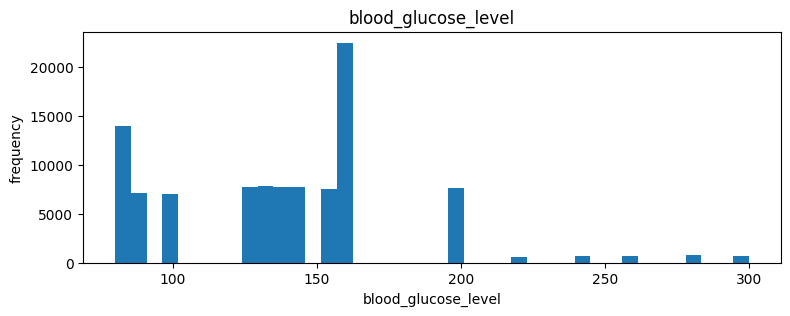

In [ ]:
numericVar = ["age","bmi","HbA1c_level", "blood_glucose_level"]
for n in numericVar:
    plot_hist(n)

## Bivariate/Multivariate visualization

In [ ]:
def plt_bi_bar(variable):
    plt.figure(figsize=(5, 2))
    sns.countplot(x=df[variable], hue=df['diabetes'], palette='Set2')
    plt.title(f'{variable} and diabetes')
    plt.xlabel(variable)
    plt.ylabel('Count')
    plt.show()

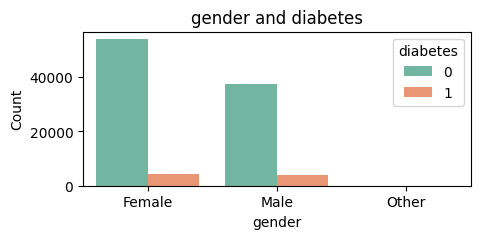

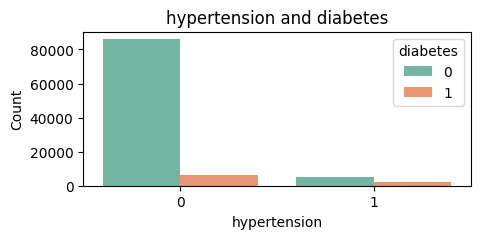

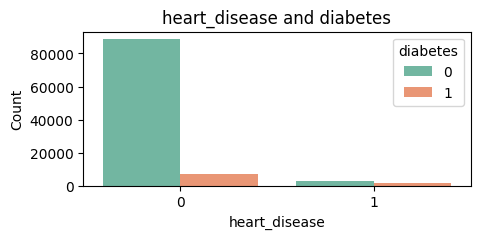

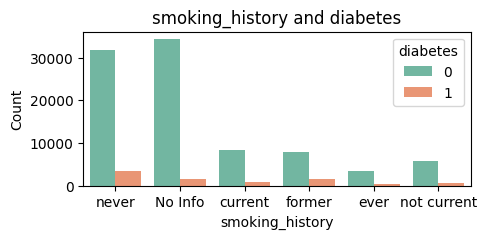

In [ ]:
category1 = ["gender","hypertension","heart_disease","smoking_history"]
for c in category1:
    plt_bi_bar(c)

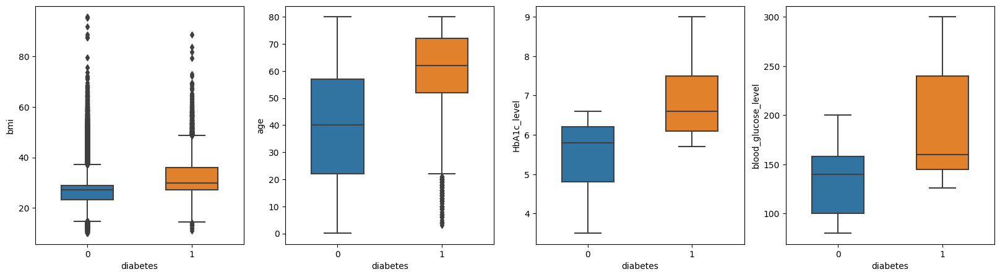

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (20,5))
sns.boxplot(ax = axes[0],x = "diabetes", y = "bmi", data = df, width=0.5)
sns.boxplot(ax = axes[1],x = "diabetes", y = "age", data = df, width=0.5)
sns.boxplot(ax = axes[2],x = "diabetes", y = "HbA1c_level", data = df, width=0.5)
sns.boxplot(ax = axes[3],x = "diabetes", y = "blood_glucose_level", data = df, width=0.5)
plt.show()
#data engineering(categorize to groups)

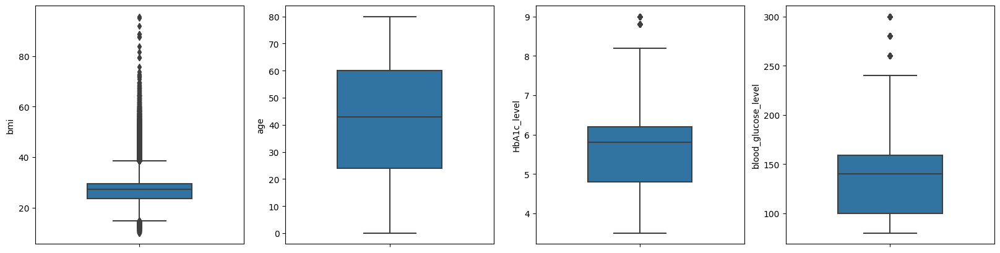

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 4, figsize = (20,5))
sns.boxplot(ax = axes[0], y = "bmi", data = df, width=0.5)
sns.boxplot(ax = axes[1], y = "age", data = df, width=0.5)
sns.boxplot(ax = axes[2], y = "HbA1c_level", data = df, width=0.5)
sns.boxplot(ax = axes[3], y = "blood_glucose_level", data = df, width=0.5)
plt.show()


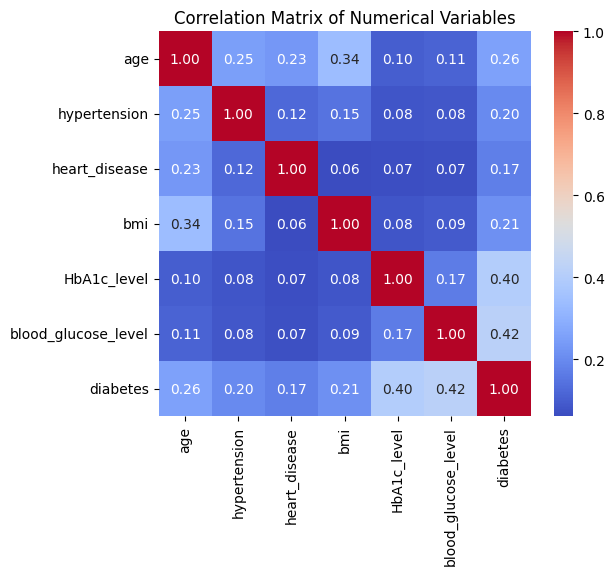

In [ ]:
df2=df.drop(['gender','smoking_history'], axis=1, inplace=False)

corr_matrix = df2.corr()
plt.figure(figsize=(6, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Matrix of Numerical Variables')
plt.show()
#feature selection

In [ ]:
#convert categorical feature into numerical feature
df2=df.copy()
df2.gender=[1 if i == "Male" else 0 if i == "Female" else -1 for i in df2.gender]
df2.smoking_history=[1 if i=="current" else 2 if i=="former" else 3 if i=="not current" else 4 if i=="ever" else 5 if i=="never" else 0 for i in df2.smoking_history]
df2.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,5,25.19,6.6,140,0
1,0,54.0,0,0,0,27.32,6.6,80,0
2,1,28.0,0,0,5,27.32,5.7,158,0
3,0,36.0,0,0,1,23.45,5.0,155,0
4,1,76.0,1,1,1,20.14,4.8,155,0


### Decision Tree
without data preprocessing

In [ ]:
#Split in 75% train and 25% test set
train_df2, test_df2 = train_test_split(df2, test_size = 0.25, random_state= 42)

#Separate target label
y_train = train_df2['diabetes']
y_test = test_df2['diabetes']

#Drop target label
x_train = train_df2.drop(['diabetes'], axis = 1)
x_test = test_df2.drop(['diabetes'], axis = 1)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

#build decision tree
model = DecisionTreeClassifier(criterion='entropy')

#fit the tree to diabetes dataset
model.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [ ]:
# #plot decision tree
# from sklearn import tree

# # features
# features = [
#     "gender",
#     "age",
#     "hypertension",
#     "heart_disease",
#     "smoking_history",
#     "bmi",
#     "HbA1c_level",
#     "blood_glucose_level"
# ]

# #figsize value changes the size of plot
# fig, ax = plt.subplots(figsize=(50, 40), dpi=200)
# tree.plot_tree(model,ax=ax,feature_names=features, filled=True, fontsize=12)
# plt.show()

In [ ]:
y_train_pred = model.predict(x_train)
y_test_pred  = model.predict(x_test)

In [ ]:
classes=[0, 1]
def plot_confusionmatrix(y_train,y_train_pred,dom):
    print(f'{dom} Confusion matrix')
    cf = confusion_matrix(y_train,y_train_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cf, display_labels=classes)
    disp.plot()

Train score 0.99932
Test score 0.95476
Train Confusion matrix
Test Confusion matrix
              precision    recall  f1-score   support

           0       0.98      0.97      0.98     22850
           1       0.74      0.74      0.74      2150

    accuracy                           0.95     25000
   macro avg       0.86      0.86      0.86     25000
weighted avg       0.95      0.95      0.95     25000



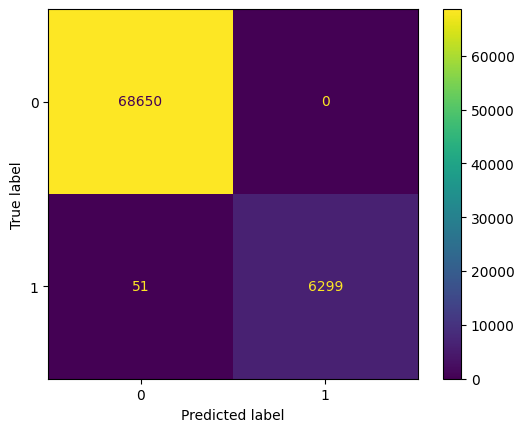

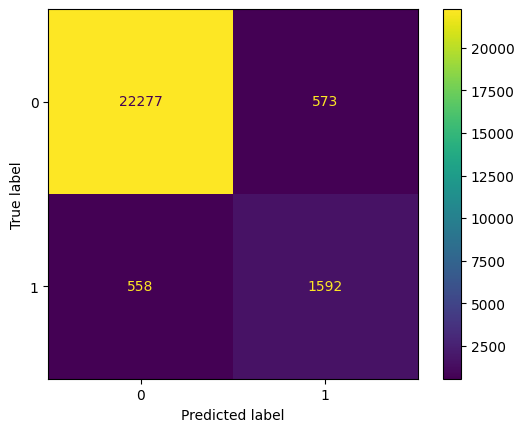

In [ ]:
print(f'Train score {accuracy_score(y_train, y_train_pred)}')
print(f'Test score {accuracy_score(y_test, y_test_pred)}')

plot_confusionmatrix(y_train,y_train_pred,dom='Train')
plot_confusionmatrix(y_test,y_test_pred,dom='Test')
print(classification_report(y_test, y_test_pred))

with preprocessing

In [ ]:
#drop gender=Other(-1)
df2.drop(df2[df2['gender'] == -1].index, inplace=True)
df2
#drop 完再random forest


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,5,25.19,6.6,140,0
1,0,54.0,0,0,0,27.32,6.6,80,0
2,1,28.0,0,0,5,27.32,5.7,158,0
3,0,36.0,0,0,1,23.45,5.0,155,0
4,1,76.0,1,1,1,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,0,80.0,0,0,0,27.32,6.2,90,0
99996,0,2.0,0,0,0,17.37,6.5,100,0
99997,1,66.0,0,0,2,27.83,5.7,155,0
99998,0,24.0,0,0,5,35.42,4.0,100,0


In [ ]:
#recategorize smoking_history
# Replace 'not_current' with 'former' and 'ever' with 'current' in the smoking_history column
df2['smoking_history'].replace({3:2, 4:1}, inplace=True)

# count number of categorical variable
varValue = df2['smoking_history'].value_counts()
varValue

smoking_history
0    35810
5    35092
2    15791
1    13289
Name: count, dtype: int64

In [ ]:
X = df2.drop(columns="diabetes").values
Y = df2["diabetes"].values

Oversampling

In [ ]:
from imblearn.over_sampling import RandomOverSampler

(182964, 9)


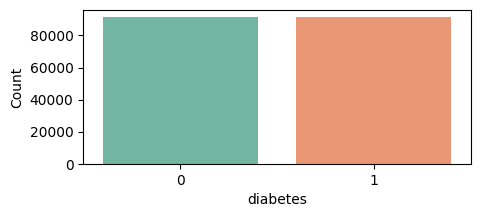

In [ ]:
#1-Random Over Sampler
oversample = RandomOverSampler(random_state=42)
x_ROS , y_ROS = oversample.fit_resample(X,Y)
newdf = pd.DataFrame(x_ROS); newdf["diabetes"]=y_ROS

print(newdf.shape)

plt.figure(figsize=(5, 2))
sns.countplot(x=newdf['diabetes'], palette='Set2')
plt.xlabel('diabetes')
plt.ylabel('Count')
plt.show()

In [ ]:
#Split in 75% train and 25% test set
train_newdf, test_newdf = train_test_split(newdf, test_size = 0.25, random_state= 42)

#Separate target label
y_train = train_newdf['diabetes']
y_test = test_newdf['diabetes']

#Drop target label
x_train = train_newdf.drop(['diabetes'], axis = 1)
x_test = test_newdf.drop(['diabetes'], axis = 1)

In [ ]:
#removing outliers: use winsoring method
#還可以選擇的model:
# decision tree needs boosting
# logit regression category to dummy columns
# naive bayes: gaussian, standardized data first

# (深度, f1 score, precision, recall)(confusion matrix, roc/auc curve)
# preprocess->cross-vali
# ada boost

In [ ]:
#recategorize smoking history
#how to handle "NO info"?? 因為它比例很大->就把它當一個類別就好

In [ ]:
#sampling to 50/50?? oversampling or undersampling?
#feature selection??


In [ ]:
#pre-pruning
params = {'max_depth': range(19,23,1),
          'min_samples_split': range(100,300,50),
          'min_samples_leaf': range(50,150,20)}

clf = DecisionTreeClassifier(criterion='entropy')
gcv = GridSearchCV(estimator=clf,param_grid=params) #estimate which value of parameter we can use to better prediction
gcv.fit(x_train,y_train)

GridSearchCV(estimator=DecisionTreeClassifier(criterion='entropy'),
             param_grid={'max_depth': range(19, 23),
                         'min_samples_leaf': range(50, 150, 20),
                         'min_samples_split': range(100, 300, 50)})

In [ ]:
model = gcv.best_estimator_ #provides the best samples that we can provide to our decision tree before splitting occurs
print("Best Fit Model")
print(model)

Best Fit Model
DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=50,
                       min_samples_split=100)


Train score 0.9284959518448074
Test score 0.9220174460549616
Train Confusion matrix
Test Confusion matrix
              precision    recall  f1-score   support

           0       0.94      0.92      0.93     68701
           1       0.92      0.94      0.93     68522

    accuracy                           0.93    137223
   macro avg       0.93      0.93      0.93    137223
weighted avg       0.93      0.93      0.93    137223

              precision    recall  f1-score   support

           0       0.93      0.91      0.92     22781
           1       0.91      0.94      0.92     22960

    accuracy                           0.92     45741
   macro avg       0.92      0.92      0.92     45741
weighted avg       0.92      0.92      0.92     45741



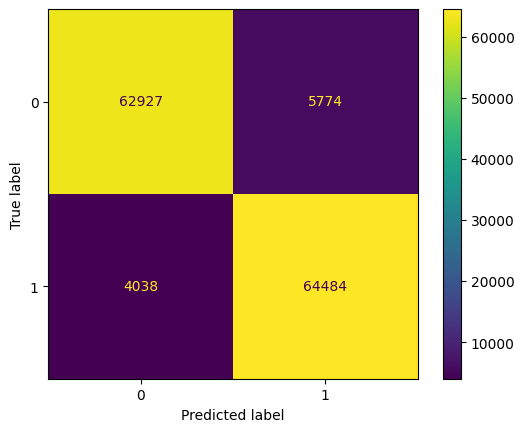

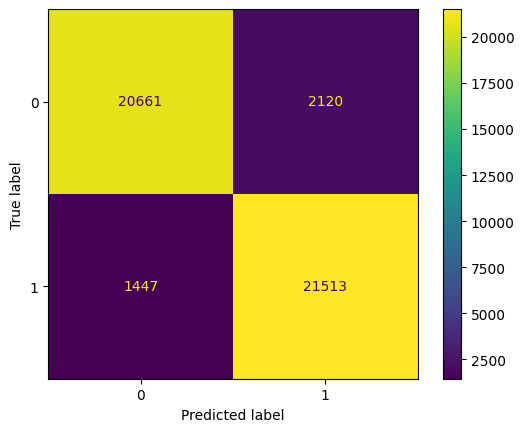

In [ ]:
model.fit(x_train,y_train)
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_test)

print(f'Train score {accuracy_score(y_train, y_train_pred)}')
print(f'Test score {accuracy_score(y_test, y_test_pred)}')
plot_confusionmatrix(y_train, y_train_pred,dom='Train')
plot_confusionmatrix(y_test, y_test_pred,dom='Test')
print(classification_report(y_train, y_train_pred))
print(classification_report(y_test, y_test_pred))

In [ ]:
# features
features = [
    "gender",
    "age",
    "hypertension",
    "heart_disease",
    "smoking_history",
    "bmi",
    "HbA1c_level",
    "blood_glucose_level"
]

#figsize value changes the size of plot
fig, ax = plt.subplots(figsize=(80, 80), dpi=200)
tree.plot_tree(model,ax=ax,feature_names=features, filled=True, fontsize=12)
plt.show()

Undersampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours

In [ ]:
#2- Random Under Sampler (Prototype Selection)

B_method = RandomUnderSampler(random_state=42)
x_RUS , y_RUS = B_method.fit_resample(X,Y)
newdf = pd.DataFrame(x_RUS);newdf["diabetes"]=y_RUS


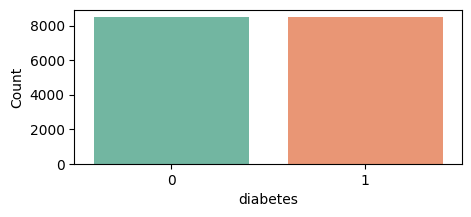

In [ ]:
plt.figure(figsize=(5, 2))
sns.countplot(x=newdf['diabetes'], palette='Set2')
plt.xlabel('diabetes')
plt.ylabel('Count')
plt.show()

In [ ]:
#Split in 75% train and 25% test set
train_newdf, test_newdf = train_test_split(newdf, test_size = 0.25, random_state= 42)

#Separate target label
y_train = train_newdf['diabetes']
y_test = test_newdf['diabetes']

#Drop target label
x_train = train_newdf.drop(['diabetes'], axis = 1)
x_test = test_newdf.drop(['diabetes'], axis = 1)


In [ ]:
#pre-pruning
params = {'max_depth': range(11,21,1),
          'min_samples_split': range(100,300,50),
          'min_samples_leaf': range(50,120,10)}

clf = DecisionTreeClassifier(criterion='entropy')
gcv = GridSearchCV(estimator=clf,param_grid=params) #estimate which value of parameter we can use to better prediction
gcv.fit(x_train,y_train)
model = gcv.best_estimator_ #provides the best samples that we can provide to our decision tree before splitting occurs
print("Best Fit Model")
print(model)


Best Fit Model
DecisionTreeClassifier(criterion='entropy', max_depth=13, min_samples_leaf=100,
                       min_samples_split=100)


Train score 0.9072941176470588
Test score 0.8969411764705882
Train Confusion matrix
Test Confusion matrix
              precision    recall  f1-score   support

           0       0.92      0.89      0.91      6361
           1       0.89      0.93      0.91      6389

    accuracy                           0.91     12750
   macro avg       0.91      0.91      0.91     12750
weighted avg       0.91      0.91      0.91     12750

              precision    recall  f1-score   support

           0       0.92      0.87      0.89      2139
           1       0.88      0.92      0.90      2111

    accuracy                           0.90      4250
   macro avg       0.90      0.90      0.90      4250
weighted avg       0.90      0.90      0.90      4250



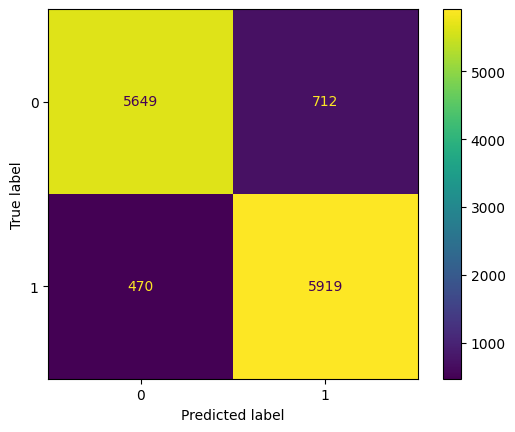

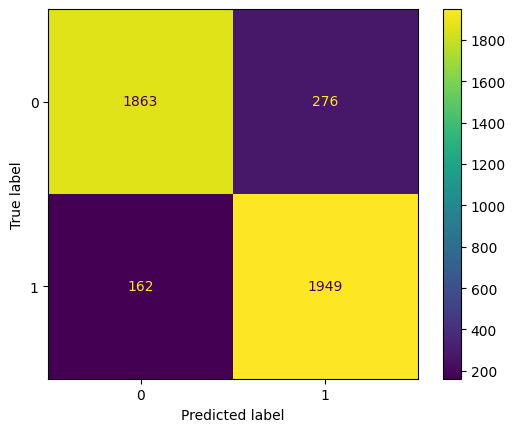

In [ ]:
model.fit(x_train,y_train)
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_test)

print(f'Train score {accuracy_score(y_train, y_train_pred)}')
print(f'Test score {accuracy_score(y_test, y_test_pred)}')
plot_confusionmatrix(y_train, y_train_pred,dom='Train')
plot_confusionmatrix(y_test, y_test_pred,dom='Test')
print(classification_report(y_train, y_train_pred))
print(classification_report(y_test, y_test_pred))


In [ ]:
#5- Edited Nearest Neighbours (Prototype Selection)
B_method = EditedNearestNeighbours()
x_ENN , y_ENN = B_method.fit_resample(X,Y)
newdf = pd.DataFrame(x_ENN);newdf["diabetes"]=y_ENN

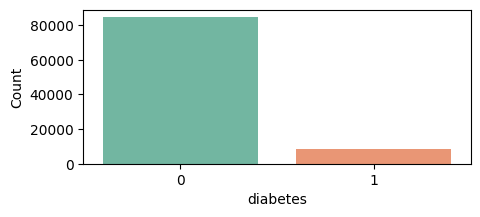

In [ ]:
plt.figure(figsize=(5, 2))
sns.countplot(x=newdf['diabetes'], palette='Set2')
plt.xlabel('diabetes')
plt.ylabel('Count')
plt.show()

In [ ]:
#Split in 75% train and 25% test set
train_newdf, test_newdf = train_test_split(newdf, test_size = 0.25, random_state= 42)

#Separate target label
y_train = train_newdf['diabetes']
y_test = test_newdf['diabetes']

#Drop target label
x_train = train_newdf.drop(['diabetes'], axis = 1)
x_test = test_newdf.drop(['diabetes'], axis = 1)

In [ ]:
#pre-pruning
params = {'max_depth': range(11,21,1),
          'min_samples_split': range(100,201,20),
          'min_samples_leaf': range(50,120,30)}

clf = DecisionTreeClassifier(criterion='entropy')
gcv = GridSearchCV(estimator=clf,param_grid=params) #estimate which value of parameter we can use to better prediction
gcv.fit(x_train,y_train)
model = gcv.best_estimator_ #provides the best samples that we can provide to our decision tree before splitting occurs
print("Best Fit Model")
print(model)

Best Fit Model
DecisionTreeClassifier(criterion='entropy', max_depth=12, min_samples_leaf=50,
                       min_samples_split=100)


Train score 0.9735015953413172
Test score 0.9717572323804619
Train Confusion matrix
Test Confusion matrix
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     63485
           1       0.97      0.74      0.84      6406

    accuracy                           0.97     69891
   macro avg       0.97      0.87      0.91     69891
weighted avg       0.97      0.97      0.97     69891

              precision    recall  f1-score   support

           0       0.97      1.00      0.98     21204
           1       0.96      0.72      0.82      2094

    accuracy                           0.97     23298
   macro avg       0.97      0.86      0.90     23298
weighted avg       0.97      0.97      0.97     23298



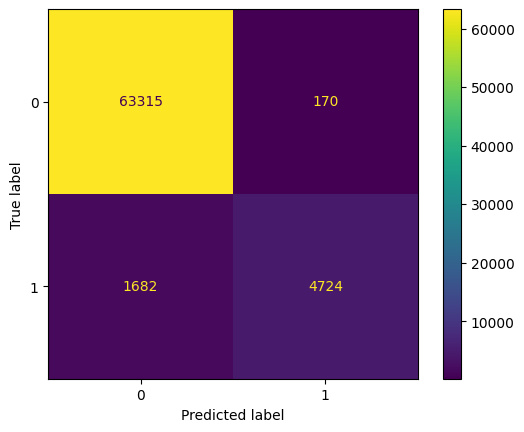

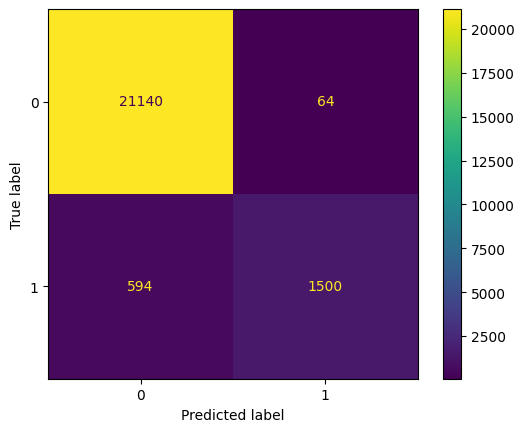

In [ ]:
model.fit(x_train,y_train)
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_test)

print(f'Train score {accuracy_score(y_train, y_train_pred)}')
print(f'Test score {accuracy_score(y_test, y_test_pred)}')
plot_confusionmatrix(y_train, y_train_pred,dom='Train')
plot_confusionmatrix(y_test, y_test_pred,dom='Test')
print(classification_report(y_train, y_train_pred))
print(classification_report(y_test, y_test_pred))

----------------

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model= RandomForestClassifier(n_estimators = 300)
rf_model.fit(x_train, y_train)

-----------------

### Naive Bayes

without prepocessing

In [ ]:
# naive bayes: gaussian, standardized data first


In [ ]:
#Standardization or normalization?
#如果decision tree data 用原本的，但NB用標準化後的可以做比較嗎?

# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# df2[['age','bmi','HbA1c_level','blood_glucose_level']] = scaler.fit_transform(df2[['age','bmi','HbA1c_level','blood_glucose_level']])
# df2.head()
# #explain why StandardScaler instead of MinmaxScaler